<a href="https://colab.research.google.com/github/bhargav23/OpenCV/blob/main/yolo/Copy_of_Yolov3_PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import torch
from IPython.display import Image, clear_output 
print('PyTorch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

PyTorch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
!git clone https://github.com/roboflow-ai/yolov3  # clone

Cloning into 'yolov3'...
remote: Enumerating objects: 8443, done.
remote: Total 8443 (delta 0), reused 0 (delta 0), pack-reused 8443
Receiving objects: 100% (8443/8443), 6.89 MiB | 30.82 MiB/s, done.
Resolving deltas: 100% (5825/5825), done.


## Get Data from Roboflow

Create an export from Roboflow. **Select "YOLO Darknet" as the export type.**

Our labels will be formatted to our model's architecture.

In [ ]:
# REPLACE THIS LINK WITH YOUR OWN
!curl -L !curl -L "https://app.roboflow.com/ds/ASYM2KVcWt?key=B6HmG5N7dx" | jar -x


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0curl: (6) Could not resolve host: !curl
100   890  100   890    0     0   1901      0 --:--:-- --:--:-- --:--:--     0
 99 22.7M   99 22.6M    0     0  19.2M      0  0:00:01  0:00:01 --:--:-- 19.2M
curl: (23) Failed writing body (1297 != 8192)


## Organize data and labels for Ultralytics YOLOv3 Implementation

Ultalytics's implemention of YOLOv3 calls for [a specific file management](https://github.com/ultralytics/yolov3/wiki/Train-Custom-Data) where our images are in a folder called `images` and corresponding labels in a folder called `labels`. The image and label names must match identically. Fortunately, our files are named appropriately from Roboflow.

We need to reorganize the folder structure slightly.

In [ ]:
%cd train

/content/train


In [ ]:
%ls

_darknet.labels
file100_jpg.rf.54b08e64f05e9881d76a28bcedae097f.jpg
file100_jpg.rf.54b08e64f05e9881d76a28bcedae097f.txt
file101_jpg.rf.e0466e031bacbcb61ce051dcd3d26e83.jpg
file101_jpg.rf.e0466e031bacbcb61ce051dcd3d26e83.txt
file103_jpg.rf.2e28770313b9d4df2b7df27303ebbda5.jpg
file103_jpg.rf.2e28770313b9d4df2b7df27303ebbda5.txt
file104_jpg.rf.a3fd7856fc96338ae18bda2267c694e0.jpg
file104_jpg.rf.a3fd7856fc96338ae18bda2267c694e0.txt
file106_jpg.rf.a466c1cc7d7d4ebeebb2ebafd68c55df.jpg
file106_jpg.rf.a466c1cc7d7d4ebeebb2ebafd68c55df.txt
file109_jpg.rf.d5fd0e339c61b15c16db131af426245a.jpg
file109_jpg.rf.d5fd0e339c61b15c16db131af426245a.txt
file110_jpg.rf.180f8368022596ba1a5f8b70b4fcf576.jpg
file110_jpg.rf.180f8368022596ba1a5f8b70b4fcf576.txt
file111_jpg.rf.6b8c978c4a5a8ae4a14971469832490e.jpg
file111_jpg.rf.6b8c978c4a5a8ae4a14971469832490e.txt
file112_jpg.rf.a40c7fecfbce63971e58ba97b49b0456.jpg
file112_jpg.rf.a40c7fecfbce63971e58ba97b49b0456.txt
file114_jpg.rf.3b85ea4df6871917de19fbe94f00662f.

In [ ]:
%mkdir labels
%mkdir images

In [ ]:
%mv *.jpg ./images/
%mv *.txt ./labels/

In [ ]:
%cd images

/content/train/images


In [ ]:
# create Ultralytics specific text file of training images
file = open("train_images_roboflow.txt", "w") 
for root, dirs, files in os.walk("."):
    for filename in files:
      # print("../train/images/" + filename)
      if filename == "train_images_roboflow.txt":
        pass
      else:
        file.write("../train/images/" + filename + "\n")
file.close()

In [ ]:
%cat train_images_roboflow.txt

../train/images/image000344_jpg.rf.d3c46892d31c19b5902712a4095bcf8d.jpg
../train/images/image000102_jpg.rf.b97c8a5533f9e1fa49b101718e106b4a.jpg
../train/images/image000311_jpg.rf.5c8144706ff18806b3e04c3e35c6ba2c.jpg
../train/images/image000089_jpg.rf.4b49ead4f476274fa5f4f5e69c8dc460.jpg
../train/images/image000290_jpg.rf.8bfedf7db88673ed78c7ad9699fdd668.jpg
../train/images/file114_jpg.rf.3b85ea4df6871917de19fbe94f00662f.jpg
../train/images/file73_jpg.rf.1838e23a6113554ca7d4c78566bd9b19.jpg
../train/images/image000400_jpg.rf.7079b3b1d32b2d2a913b67ced4028b61.jpg
../train/images/image000328_jpg.rf.6d20a0bf9e240b8b040080783f97120e.jpg
../train/images/image000122_jpg.rf.af810a518ca88e94c9901a74f663903a.jpg
../train/images/image000326_jpg.rf.6fc30d686d1aea1b536448c09debb76a.jpg
../train/images/file68_jpg.rf.08cf1905c13bf9b53e6f733b8008f083.jpg
../train/images/image000377_jpg.rf.66bf255577f7b3136a2cd390fd06c998.jpg
../train/images/file219_jpg.rf.a585f59d74451af19780d491c41585d9.jpg
../train/i

In [ ]:
%cd ../../valid

/content/valid


In [ ]:
%mkdir labels
%mkdir images

In [ ]:
%mv *.jpg ./images/
%mv *.txt ./labels/

In [ ]:
%cd images

/content/valid/images


In [ ]:
# create Ultralytics specific text file of validation images
file = open("valid_images_roboflow.txt", "w") 
for root, dirs, files in os.walk("."):
    for filename in files:
      # print("../train/images/" + filename)
      if filename == "valid_images_roboflow.txt":
        pass
      else:
        file.write("../valid/images/" + filename + "\n")
file.close()

In [ ]:
%cat valid_images_roboflow.txt

../valid/images/image000352_jpg.rf.6d6e8e703c3d0b0218c877e840306566.jpg
../valid/images/image000235_jpg.rf.7bb7a32520cfb739839d3adf7bd3f9b6.jpg
../valid/images/file235_jpg.rf.6e92bebcbbdd9c62a3ae627f9feec1e1.jpg
../valid/images/image000166_jpg.rf.cc4df7d69a42dca67015bad24d4d198d.jpg
../valid/images/image000273_jpg.rf.60a24119a8ab57c146a09ebdf5af741a.jpg
../valid/images/image000043_jpg.rf.2be0c3ffb4ccc42feeb37bcda2bdc212.jpg
../valid/images/image000245_jpg.rf.4f94057dc1289adb46eb19962699c043.jpg
../valid/images/image000075_jpg.rf.5dc499707907b60c65241d26f766487d.jpg
../valid/images/image000374_jpg.rf.0bdcb829505a29f3d37afe03d49105c4.jpg
../valid/images/file84_jpg.rf.f8945c242481a7fd4dee88223688c93b.jpg
../valid/images/image000042_jpg.rf.b7b40da20115456758a9164a6bc00ccf.jpg
../valid/images/image000282_jpg.rf.82c080247d59bf0a64f17b7cfa7d9952.jpg
../valid/images/image000444_jpg.rf.45694fc096d4ed864255292badf2246d.jpg
../valid/images/image000003_jpg.rf.33354a1ae3e5bb6efed03f063e2947aa.jpg
.

## Set up model config

We should configure our model for training.

This requires editing the `roboflow.data` file, which tells our model where to find our data, our numbers of classes, and our class label names.

Our paths for our labels and images are correct.

But we need to update our class names. That's handled below..




In [ ]:
%cd ../../yolov3/data

/content/yolov3/data


In [ ]:
# display class labels imported from Roboflow
%cat ../../train/_darknet.labels

busfront
busrear
busroute
busside
frontdoor
reardoor

In [ ]:
# convert .labels to .names for Ultralytics specification
%cat ../../train/_darknet.labels > ../../train/roboflow_data.names

In [ ]:
def get_num_classes(labels_file_path):
    classes = 0
    with open(labels_file_path, 'r') as f:
      for line in f:
        classes += 1
    return classes

In [ ]:
# update the roboflow.data file with correct number of classes
import re

num_classes = get_num_classes("../../train/_darknet.labels")
with open("roboflow.data") as f:
    s = f.read()
with open("roboflow.data", 'w') as f:
    
    # Set number of classes num_classes.
    s = re.sub('classes=[0-9]+',
               'classes={}'.format(num_classes), s)
    f.write(s)

In [ ]:
# display updated number of classes
%cat roboflow.data

classes=6
train=../train/images/train_images_roboflow.txt
valid=../valid/images/valid_images_roboflow.txt
names=../train/roboflow_data.names


In [ ]:
cd data

[Errno 2] No such file or directory: 'data'
/content/yolov3/data


In [ ]:
ls

coco16.data    coco1.data     coco64.data       get_coco2014.sh*
coco16.txt     coco1.txt      coco64.txt        get_coco2017.sh*
coco1cls.data  coco2014.data  coco.names*       roboflow.data
coco1cls.txt   coco2017.data  coco_paper.names  samples/


## Training our model

Once we have our data prepped, we'll train our model using the train script.

By default, this script trains for 300 epochs.

In [ ]:
%cd ../

/content/yolov3


In [ ]:
!python3 train.py --data data/roboflow.data --epochs 300

Namespace(accumulate=4, adam=False, batch_size=16, bucket='', cache_images=False, cfg='cfg/yolov3-spp.cfg', data='data/roboflow.data', device='', epochs=300, evolve=False, img_size=[416], multi_scale=False, name='', nosave=False, notest=False, rect=False, resume=False, single_cls=False, var=None, weights='weights/yolov3-spp-ultralytics.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

2021-07-10 06:59:09.874827: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Model Summary: 225 layers, 6.29987e+07 parameters, 6.29987e+07 gradients
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   408    0   408    0     0   3187      0 --:--:-- --:--:-- --:--:--  3162
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0   

## Display training performance

We'll use a default provided script to display image results. **For example:**

![example results](https://user-images.githubusercontent.com/26833433/63258271-fe9d5300-c27b-11e9-9a15-95038daf4438.png)

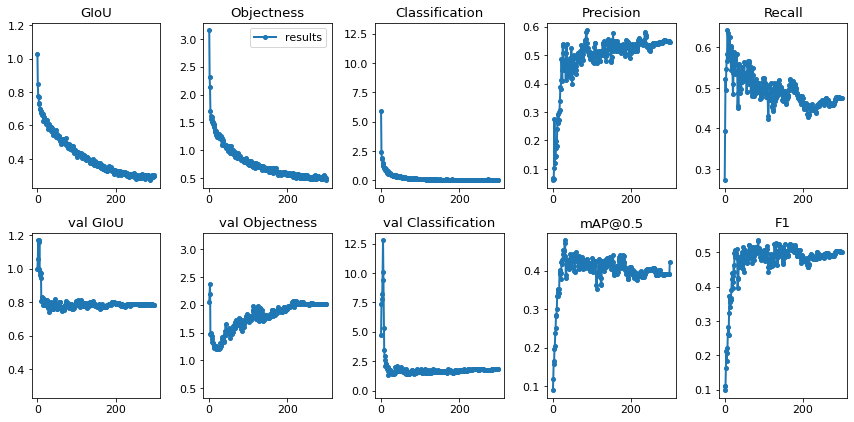

In [ ]:
from utils import utils; utils.plot_results()

## Conduct inference and display results



### Conduct inference

The below script has a few key arguments we're using:
- **Weights**: we're specifying the weights to use for our model should be those that we most recently used in training
- **Source**: we're specifying the source images we want to use for our predictions
- **Names**: we're defining the names we want to use. Here, we're referencing `roboflow_data.names`, which we created from our Roboflow `_darknet.labels`italicized text above.

In [ ]:
!python3 detect.py --weights weights/last.pt --source=../test --names=../train/roboflow_data.names

Namespace(agnostic_nms=False, cfg='cfg/yolov3-spp.cfg', classes=None, conf_thres=0.3, device='', fourcc='mp4v', half=False, img_size=416, iou_thres=0.6, names='../train/roboflow_data.names', output='output', save_txt=False, source='../test', view_img=False, weights='weights/last.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15109MB)

Model Summary: 225 layers, 6.29987e+07 parameters, 6.29987e+07 gradients
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
image 1/72 ../test/file11_jpg.rf.0641ec86ce9ae2635e731e0b641b2169.jpg: 416x416 Done. (0.055s)
image 2/72 ../test/file135_jpg.rf.8665791e2f074f3cfc086602bdff9

### Displaying our results

Ultralytics generates predictions which include the labels and bounding boxes "printed" directly on top of our images. They're saved in our `output` directory within the YOLOv3 repo we cloned above.

In [ ]:
# import libraries for display
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Image
from glob import glob
import random
import PIL

file11_jpg.rf.0641ec86ce9ae2635e731e0b641b2169.jpg


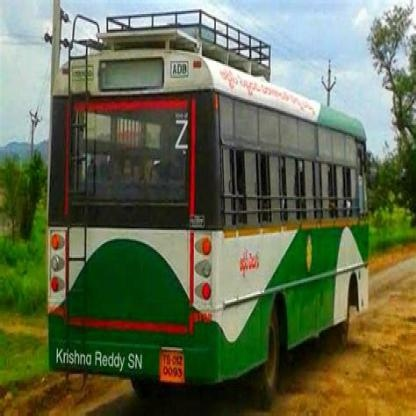

In [ ]:
# plot just one random image prediction
filename = random.choice(os.listdir('./output'))
print(filename)
Image('./output/' + filename)

In [ ]:
# grab all images from our output directory
images = [ PIL.Image.open(f) for f in glob('./output/*') ]

In [ ]:
# convert images to numPy
def img2array(im):
    if im.mode != 'RGB':
        im = im.convert(mode='RGB')
    return np.fromstring(im.tobytes(), dtype='uint8').reshape((im.size[1], im.size[0], 3))

In [ ]:
# create array of numPy images
np_images = [ img2array(im) for im in images ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  """


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


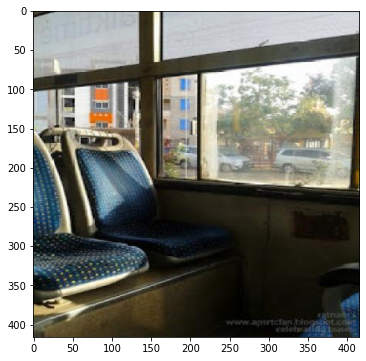

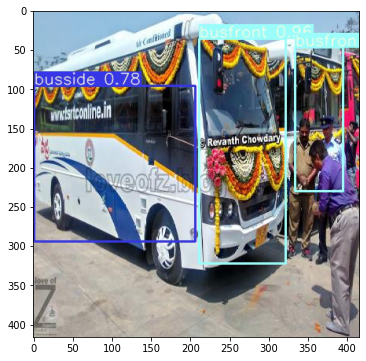

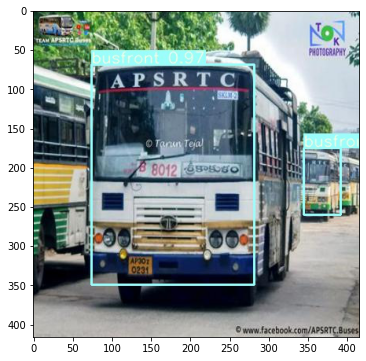

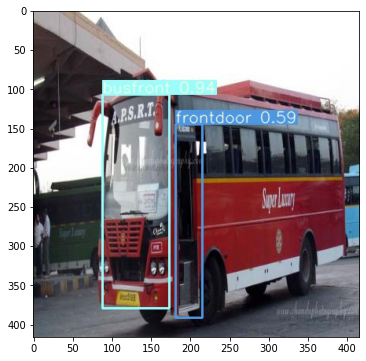

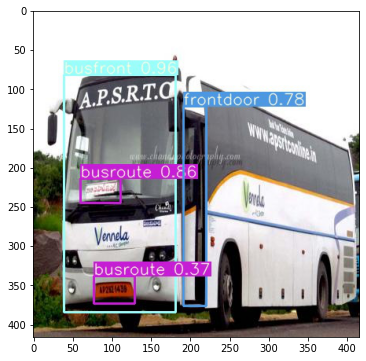

...

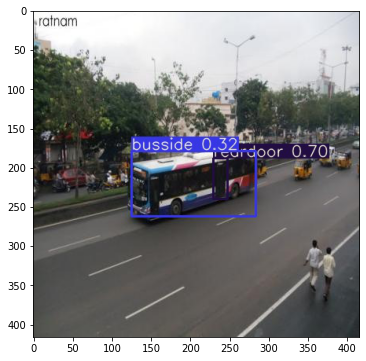

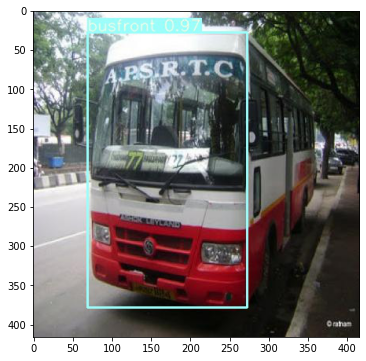

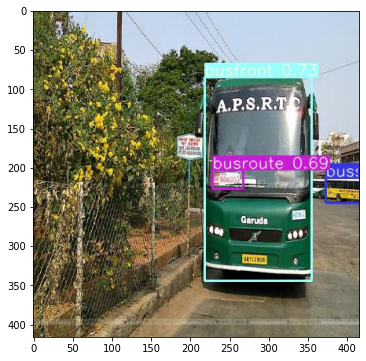

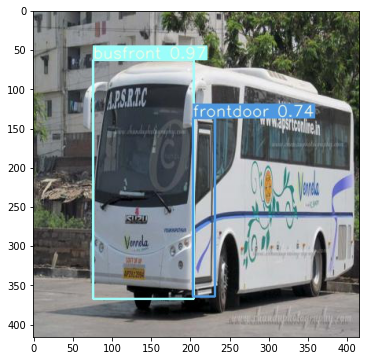

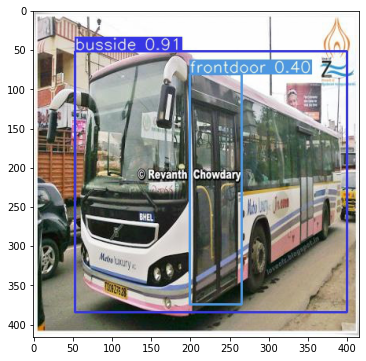

In [ ]:
# plot ALL results in test directory (NOTE: adjust figsize as you please)
for img in np_images:
    plt.figure(figsize=(8, 6))
    plt.imshow(img)

## Save Our Weights

We can save the weights of our model to use them for inference in the future, or pick up training where we left off. 

We can first save them locally. We'll connect our Google Drive, and save them there.


In [ ]:
# save locally
from google.colab import files
files.download('./weights/last.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# connect Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%pwd

In [ ]:
# create a copy of the weights file with a datetime 
# and move that file to your own Drive
%cp ./weights/last.pt ./weights/last_copy.pt
%mv ./weights/last_copy.pt /content/gdrive/MyDrive/Data/